# Рынок заведений общественного питания Москвы

# Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.



# Цель исследования: 

Подготовить аналитический анализ исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

# План выполнения работы: 

Осуществить первичный обзор данных.
Провести предобработку данных (обработка пропусков, изменение типов данных, обработка дубликатов, добавление столбцов).
Выполнить анализ данных.

## Загрузка данных и общая информация

In [1]:
# импорт библиотек
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from plotly import graph_objects as go 
import plotly.express as px
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
df.tail(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8396,Пекинский Двор,ресторан,"Москва, Ленинский проспект, 158",Западный административный округ,"ежедневно, 11:00–23:00",55.651706,37.482667,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,200.0
8397,Траектория Крафт-Кафе,пиццерия,"Москва, улица Лобачевского, 52, корп. 1",Западный административный округ,"пн-пт 10:00–23:00; сб,вс 12:00–23:00",55.672011,37.492628,4.4,средние,NaN,NaN,NaN,0,60.0
8398,На Волгина,кафе,"Москва, улица Академика Волгина, 2А",Юго-Западный административный округ,"ежедневно, 09:00–23:00",55.654933,37.521421,4.4,NaN,NaN,NaN,NaN,0,49.0
8399,"Пекарня, кафе-гриль",булочная,"Москва, Болотниковская улица, 52, корп. 2",Юго-Западный административный округ,"ежедневно, круглосуточно",55.662866,37.582572,4.2,NaN,Средний счёт:50–250 ₽,150.0,NaN,0,50.0
8400,Практика Кофе,кофейня,"Москва, Чонгарский бульвар, 26А, корп. 1",Юго-Западный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.654289,37.600722,4.4,NaN,NaN,NaN,NaN,0,55.0
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0
8405,Kebab Time,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Датафрейм хранит информацию о 8406 объектах питания.

Согласно документации к данным:

name — название заведения;

address — адрес заведения;

category — категория заведения, например «кафе», «пиццерия» или «кофейня»;

hours — информация о днях и часах работы;

lat — широта географической точки, в которой находится заведение;

lng — долгота географической точки, в которой находится заведение;

rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;

middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым

district — административный район, в котором находится заведение, например Центральный административный округ;

seats — количество посадочных мест.

## Предобработка данных

In [5]:
df['name'] = df['name'].str.lower()

### Удаление дубликатов

In [6]:
print(f'Количество явных дубликатов {df.duplicated().sum()}')

Количество явных дубликатов 0


In [7]:
df.duplicated(subset=['name', 'address']).sum()

3

In [8]:
df.loc[df.duplicated(subset=['name', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [9]:
df.drop_duplicates(subset=['name', 'address'], keep='first', inplace=True)

После проверки по названию заведения и адресу дубликатом выглядит вторая строка с данными ресторана "more poke". Вторые строки для заведений "раковарня клешни и хвосты" и "хлеб да выпечка" содержат разные категории заведений и немного разные координаты. Так как адрес один, будем считать это дубликатами и удалим строки.

In [10]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [11]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [12]:
# смотрим названия которые встречаются чаще всего 
df.groupby('name') \
    .agg(count=('name', 'count')) \
    .sort_values(by='count', ascending=False) \
    .reset_index() \
    .head(30)

,name,count
0,кафе,189
1,шоколадница,120
2,домино'с пицца,77
3,додо пицца,74
4,one price coffee,72
5,яндекс лавка,69
6,cofix,65
7,prime,50
8,хинкальная,44
9,шаурма,43


Сетевых заведений в этом списке большинство. Однако, встречаются задевения с названиями "кафе", "столовая", "ресторан". За таким названиями могут тоже встречаться дубликаты.

In [13]:
# проверяем есть ли сетевые заведения с такими названиями
df.query('(name == "кафе" or name == "ресторан" or name == "столовая") and chain == 1')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Список пуст. Сетевых заведений нет. Нужна проверка на выявление неявных дубликатов.

In [14]:
df['first_name'] = df['name'].str.split(' ').str[0]

In [15]:
df.duplicated(subset=['first_name', 'category', 'address']).sum()

15

In [16]:
df.loc[df.duplicated(subset=['first_name', 'category', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,first_name
20,чебуреки манты,кафе,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880287,37.448646,4.3,NaN,NaN,NaN,NaN,1,148.0,чебуреки
55,чебуреки и манты,кафе,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880288,37.448645,4.3,NaN,NaN,NaN,NaN,0,148.0,чебуреки
416,чайхана халал,ресторан,"Москва, Смольная улица, 24Г, стр. 6",Северный административный округ,"ежедневно, круглосуточно",55.860894,37.482553,4.3,NaN,NaN,NaN,NaN,0,53.0,чайхана
450,чайхана халаль,ресторан,"Москва, Смольная улица, 24Г, стр. 6",Северный административный округ,"ежедневно, круглосуточно",55.860892,37.482538,4.3,NaN,NaN,NaN,NaN,1,53.0,чайхана
1642,кафе для поминок,кафе,"Москва, улица Верхняя Масловка, 10, стр. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.793295,37.565569,4.9,NaN,NaN,NaN,NaN,0,50.0,кафе
1671,кафе замок,кафе,"Москва, улица Верхняя Масловка, 10, стр. 4",Северный административный округ,"ежедневно, 10:00–00:00",55.793331,37.565588,4.2,средние,Средний счёт:700–1000 ₽,850.0,NaN,0,50.0,кафе
2384,хлеб насущный,булочная,"Москва, Комсомольская площадь, 3",Центральный административный округ,"ежедневно, круглосуточно",55.776529,37.655238,4.1,NaN,NaN,NaN,NaN,1,200.0,хлеб
2467,хлеб насущный экспресс,булочная,"Москва, Комсомольская площадь, 3",Центральный административный округ,пн-пт 07:00–21:00; сб 07:00–20:00; вс 08:00–20:00,55.779720,37.654411,4.1,NaN,NaN,NaN,NaN,0,200.0,хлеб
2719,dragon bubble tea,кафе,"Москва, Щёлковское шоссе, вл75",Восточный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.810949,37.799413,4.0,NaN,NaN,NaN,NaN,0,NaN,dragon
2833,царская кофейня,кофейня,"Москва, Измайловское шоссе, 73Ж",Восточный административный округ,"сб,вс 10:00–20:00",55.794209,37.749043,4.0,NaN,NaN,NaN,NaN,0,NaN,царская


Часть заведений это дубликаты. Заведения имеют сильно схожие названия, адреса и категории. Для чистоты исследование их необходимо удалить.

In [17]:
df = df.drop(df[(df['name'] == "кафе") & (df['address'] == "Москва, Ореховый бульвар, 28")].index)

In [18]:
df = df.drop(df[(df['name'] == "estetica cafe") & (df['address'] == "Москва, Кировоградская улица, 15")].index)

In [19]:
df = df.drop(df[(df['name'] == "чайхана дружба") & (df['address'] == "Москва, Большая Очаковская улица, 47А, стр. 1")].index)

In [20]:
df = df.drop(df[(df['name'] == "от мяса до рыбы") & (df['address'] == "Москва, улица Вавилова, 64/1с1")].index)

In [21]:
df = df.drop(df[(df['name'] == "vip wok and sushi") & (df['address'] == "Москва, Можайское шоссе, 45Б")].index)

In [22]:
df = df.drop(df[(df['name'] == "udcкафе upside down cake") & (df['address'] == "Москва, Кутузовский проспект, 57")].index)

In [23]:
df = df.drop(df[(df['name'] == "баку 24 часа") & (df['address'] == "Москва, Монтажная улица, 9, стр. 1")].index)

In [24]:
df = df.drop(df[(df['name'] == "dragon bubble tea") & (df['address'] == "Москва, Щёлковское шоссе, вл75")].index)

In [25]:
df = df.drop(df[(df['name'] == "чайхана халал") & (df['address'] == "Москва, Смольная улица, 24Г, стр. 6")].index)

In [26]:
df = df.drop(df[(df['name'] == "чебуреки манты") & (df['address'] == "Москва, Правобережная улица, 1Б")].index)

In [27]:
# удаляем технический столбец
df = df.drop(['first_name'], axis=1)

In [28]:
print('Удалено', 8406 - len(df), 'дубликатов. В обновленных данных', len(df), 'заведения.' )


Удалено 13 дубликатов. В обновленных данных 8393 заведения.


### Заполнение пропущенных значаний

In [29]:
# смотрим количество пропусков
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 533
lat                     0
lng                     0
rating                  0
price                5078
avg_bill             4577
middle_avg_bill      5244
middle_coffee_cup    7858
chain                   0
seats                3609
dtype: int64

Не во всех случаях нам удастся восполнить пропущенные значения в данных.

In [30]:
# замена пропущенных значений
df['hours'] = df['hours'].fillna('данные отсутствуют')

In [31]:
# замена пропущенных значений
df['price'] = df['price'].fillna('данные отсутствуют')

In [32]:
# замена пропущенных значений
df['avg_bill'] = df['avg_bill'].fillna('данные отсутствуют')

Пропуски в остальных столбцах заполним заглушками для возможности проведения дальнейших операций.

In [33]:
# ставим заглушку 0 в столюец со средним чеком
df['middle_avg_bill'] = df['middle_avg_bill'].fillna(0)

In [34]:
# ставим заглушку 0 в столбец со средней стоимостью чашки кофе
df['middle_coffee_cup'] = df['middle_coffee_cup'].fillna(0)

In [35]:
# ставим заглушку -100 в столбец с количеством посадочных мест
df['seats'] = df['seats'].fillna(-100)

In [36]:
# проверка
df.isna().sum()

name                 0
category             0
address              0
district             0
hours                0
lat                  0
lng                  0
rating               0
price                0
avg_bill             0
middle_avg_bill      0
middle_coffee_cup    0
chain                0
seats                0
dtype: int64

### Добавление новых столбцов

In [37]:
# создаем функцию для отделения названия улицы
def street_check(row):
    address = row['address'].split(', ')
    street = address[1]
    return street

df['street'] = df.apply(street_check, axis=1)

In [38]:
df['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [39]:
# добавление столбца с заведениями работающими 24/7
df['is_24/7'] = np.where((df['hours']== 'ежедневно, круглосуточно'), True, False)

Новые столбцы добавлены в датафрейм. Теперь необходимо изменить типы данных на подходящие.

### Изменение типов данных

In [40]:
# замена типа данных на целочисленный
df['seats'] = df['seats'].astype('int')

In [41]:
# замена типа данных на целочисленный
df['middle_coffee_cup'] = df['middle_coffee_cup'].astype('int')

In [42]:
# замена типа данных на целочисленный#
df['middle_avg_bill'] = df['middle_avg_bill'].astype('int')

Для каждого столбца тип данных корректный. Пропущенных значений и дубликатов не обнаружено. Данные гостовы для анализа.

In [43]:
# проверка
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8393 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8393 non-null   object 
 1   category           8393 non-null   object 
 2   address            8393 non-null   object 
 3   district           8393 non-null   object 
 4   hours              8393 non-null   object 
 5   lat                8393 non-null   float64
 6   lng                8393 non-null   float64
 7   rating             8393 non-null   float64
 8   price              8393 non-null   object 
 9   avg_bill           8393 non-null   object 
 10  middle_avg_bill    8393 non-null   int64  
 11  middle_coffee_cup  8393 non-null   int64  
 12  chain              8393 non-null   int64  
 13  seats              8393 non-null   int64  
 14  street             8393 non-null   object 
 15  is_24/7            8393 non-null   bool   
dtypes: bool(1), float64(3), 

### Вывод

Предобработка данных завершена. Удалены 13 дубликатов, добавлены новые столбцы "street" с названием улицы и "is_24/7" с булевым значением True или False является ли заведение круглосуточным. Пропущенные значения восстановить не представилось возможным, в некоторых случаях было принято решение поставить "заглушки". В солбцах "seats", "middle_coffee_cup" и "middle_avg_bill" был изменен тип данных на целочисленный.

## Анализ данных

### Исследование количества объектов общественного питания по категориям

In [44]:
# группировка данных из дф по категориям
categories = df.groupby('category') \
                 .agg(count=('category', 'count')) \
                 .sort_values(by='count', ascending=False) \
                 .reset_index()

In [45]:
categories

,category,count
0,кафе,2371
1,ресторан,2040
2,кофейня,1412
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,602
6,столовая,315
7,булочная,256


In [46]:
# создание круговой диаграммы
fig = go.Figure(data=[go.Pie(labels=categories['category'], values=categories['count'])])
fig.update_layout(title='Количество объектов общественного питания Москвы по категориям', 
                  width=800, 
                  height=500,
                  annotations=[dict(x=1.16, 
                                    y=1.05,
                                    text='Категория',
                                    showarrow=False)])
fig.show() 

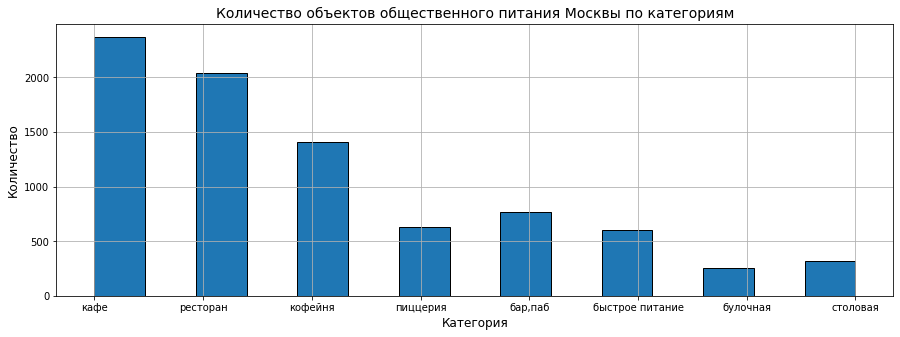

In [105]:
plt.figure(figsize =(15, 5))
h = df['category'].hist(bins=15, edgecolor='black')
plt.title('Количество объектов общественного питания Москвы по категориям', fontsize=14)
plt.xlabel('Категория', fontsize=12)
plt.ylabel('Количество', fontsize=12)
fig = h.get_figure()

По количество заведени лидируют кафе 28.2%. Следом за ними расположились рестораны 24.3%& стоит отметить, что суммарно эти две категории занимают более половины рынка предприятий общественного питания в Москве. Доля булочных и столовых составляет всего 3.05% и 3.75% соответственно. Такие заведения самые малочисленные в столице.

### Исследование количества посадочных мест в местах по категориям

In [48]:
# группировка данных из дф по количеству посадочных мест, удаляем заглушку
seats = df.query('seats != -100') \
            .groupby('category') \
            .agg(seats_median=('seats', 'median')) \
            .sort_values(by='seats_median', ascending=False) \
            .reset_index()
seats['seats_median'] = seats['seats_median'].astype('int')

In [49]:
seats

,category,seats_median
0,ресторан,86
1,"бар,паб",82
2,кофейня,80
3,столовая,75
4,быстрое питание,67
5,кафе,60
6,пиццерия,55
7,булочная,50


In [50]:
# создание столбчатой диаграммы 
fig = px.bar(seats.sort_values(by='seats_median', ascending=True),
             x='seats_median', 
             y='category', 
             text='seats_median')
# оформление графика
fig.update_layout(title='Количество посадочных мест в объектах общественного питания по категориям',
                   xaxis_title='Количество посадочных мест',
                   yaxis_title='Объект общественного питания')
fig.show() 

По количеству посадочных мест в заведениях общественного питания рестораны, бары и кофейни оказались самыми вместительными в среднем 80-86 посадочных мест. Булочные и пиццерии наоборот оказались внизу таблицы и располагают в среднем 50-55 посадочными местами.

### Исследование соотношения сетевых и несетевых заведений

In [51]:
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,данные отсутствуют,данные отсутствуют,0,0,0,-100,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550,0,0,4,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000,0,0,45,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,данные отсутствуют,Цена чашки капучино:155–185 ₽,0,170,0,-100,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500,0,1,148,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,данные отсутствуют,данные отсутствуют,0,0,0,86,Профсоюзная улица,False
8402,миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,данные отсутствуют,данные отсутствуют,0,0,0,150,Пролетарский проспект,False
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,данные отсутствуют,Средний счёт:от 150 ₽,150,0,0,150,Люблинская улица,True
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,данные отсутствуют,данные отсутствуют,0,0,1,150,Люблинская улица,True


In [52]:
chain_type = ['сетевые заведения', 'несетевые заведения']

In [53]:
values = [len(df.query('chain == 1')), len(df.query('chain == 0'))]

In [54]:
fig = go.Figure(data=[go.Pie(labels=chain_type, values=values)])
fig.update_layout(title='Cоотношение сетевых и несетевых объектов общественного питания', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1, 
                                    y=1,
                                    text='Категория',
                                    showarrow=False)])
fig.show() 

Преимущественное большинство, а именно 61.8% объектов общественного питания - это несетевые заведения. Доля сетевых объектов общественного питания составляет 38.2%. 

### Исследование категорий сетевых заведений

In [55]:
chain_category = df.groupby(['category', 'chain']) \
                          .agg(count=('category', 'count')) \
                        .sort_values(by='count', ascending=False)\
                          .reset_index()

In [56]:
chain_category['chain'] = chain_category['chain'].apply(lambda x: 'сетевые' if x == 1 else 'несетевые')#.sort_values()

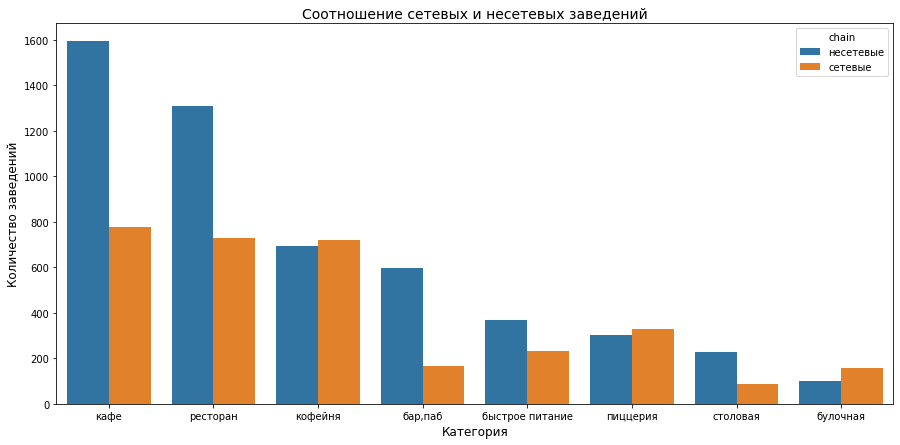

In [57]:
plt.figure(figsize=(15, 7))
# строим барплот
sns.barplot(x='category', 
            y='count', 
            data=chain_category,
            hue='chain')

# заголовок графика и подписи осей
plt.title('Соотношение сетевых и несетевых заведений', fontsize=14)
plt.xlabel('Категория', fontsize=12)
plt.ylabel('Количество заведений', fontsize=12)

plt.xticks(rotation=0)

# отображаем график на экране
plt.show()

Категории объектов питания где количество сетевых заведений превышает количество несетевых это булочные, кофейни и пиццерии. Во всех остальных случаях несетевых заведений больше чем сетевых, особенно стоит отметить категорию "бар,паб", где заметна разница более чем в 3 раза.

### Изучение топ-15 популярных сетей в Москве

In [58]:
top15 = df.query('chain == 1') \
                   .groupby('name') \
                   .agg(count=('name', 'count')) \
                   .sort_values(by='count', ascending=False) \
                   .reset_index() \
                   .head(15)

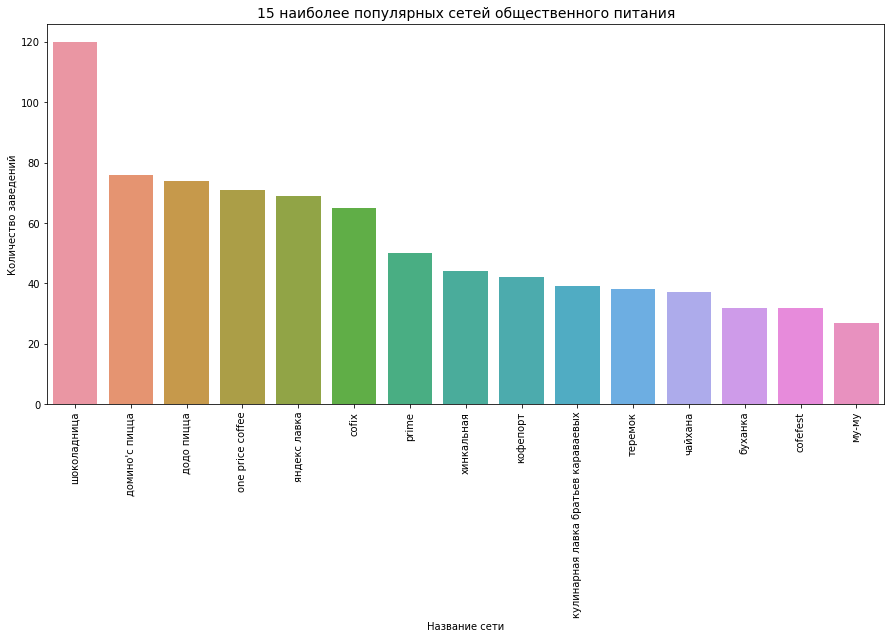

In [59]:
plt.figure(figsize=(15, 7))
# строим барплот график 
sns.barplot(x='name', 
            y='count', 
            data=top15) 
# заголовок графика и подписи осей
plt.title('15 наиболее популярных сетей общественного питания', fontsize=14)
plt.xlabel('Название сети', fontsize=10)
plt.ylabel('Количество заведений', fontsize=10)

plt.xticks(rotation=90)
# отображаем график на экране
plt.show()

Несмотря на то, что я не проживаю в Москве, большинство заведений мне знакомы. Теперь определим к каким категориям относятся эти 15 крупных сетей.

In [60]:
top15_chain_names = top15['name']

In [61]:
top15_chain_category = df.query('chain == 1 and name in @top15_chain_names') \
                            .groupby(['category', 'name']) \
                            .agg(count=('name', 'count')) \
                            .reset_index() 

In [62]:
top15_chain_category

,category,name,count
0,"бар,паб",му-му,1
1,"бар,паб",хинкальная,3
2,булочная,буханка,25
3,быстрое питание,му-му,2
4,быстрое питание,теремок,2
5,быстрое питание,хинкальная,6
6,быстрое питание,чайхана,2
7,кафе,cofefest,1
8,кафе,prime,1
9,кафе,буханка,1


In [63]:
fig = px.bar(top15_chain_category, 
             x='category', 
             y='count', 
             color='name')
fig.update_layout(title='Количество заведений из популярных сетей по категориям',
                  xaxis_title='Категория',
                  yaxis_title='Количество заведений',
                  xaxis={'categoryorder':'total descending'})
fig.show()

Максимальное число сетевых заведений приходится на кофейни, рестораны, пиццерии и кафе. Самая популярная кофейня - "Шоколадница". Самый популярный ресторан - "Яндекс лавка". Самая популярная пиццерия "Домино'с пицца". Самое популярное кафе "Кулинарная лавка братьев Караваевых". Отдельно хочется отметить, что некоторые сети относятся к разным категориям. Возможно, это ошибка выгрузки или ошибка заполнения данных.

### Исследование общего количества заведений и количества заведений каждой категории по районам

In [64]:
# группируем по району и категории
zone_category = df.groupby(['district', 'category']) \
                        .agg(count=('name', 'count')) \
                        .sort_values(by='count', ascending=False) \
                        .reset_index() 

In [65]:
# создаем столбец с суммарным количеством заведений в районе
for d in zone_category['district'].unique():
    zone_category.loc[(zone_category['district'] == d), 'total_count']  = \
    zone_category.loc[(zone_category['district'] == d), 'count'].sum()

In [66]:
fig = px.bar(zone_category.sort_values(by='total_count', ascending=False), 
             x='district', 
             y='count', 
             color='category')
fig.update_layout(title='Количество заведений каждой категории по районам',
                  xaxis_title='Район Москвы',
                  yaxis_title='Количество заведений')
fig.show()

В ЦАО функционирует наибольшее количество объектов общественного питания. Большая часть заведений это рестораны, кафе, кофейни и бары.
В остальных округах количество заведений в 2-3 раза меньше. В СЗАО наименьшее количество заведений.

### Изучение распределения средних рейтингов по категориям заведений

In [67]:
# группируем по категориям и получаем медианные значения
category_rat = df.groupby('category') \
                       .agg(median_rating=('rating', 'median')) \
                       .sort_values(by='median_rating', ascending=False) \
                       .reset_index()

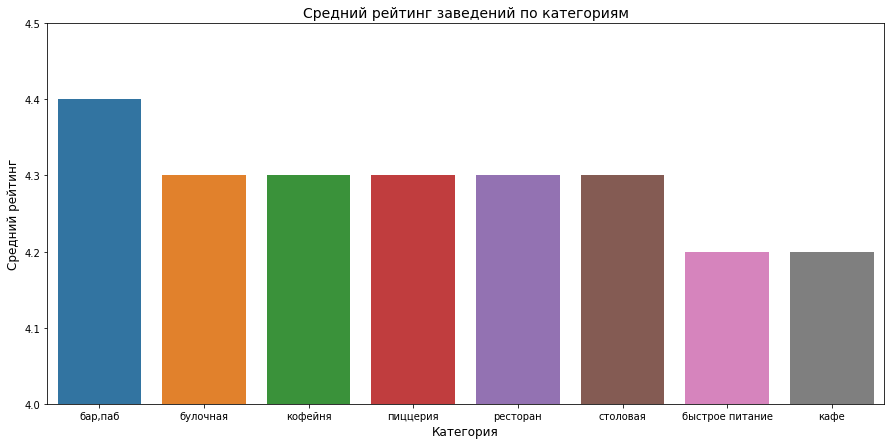

In [68]:
plt.figure(figsize=(15, 7))
# строим барплот 
sns.barplot(x='category', y='median_rating', data=category_rat) 

# заголовок графика и подписи осей
plt.title('Средний рейтинг заведений по категориям', fontsize=14)
plt.xlabel('Категория', fontsize=12)
plt.ylabel('Средний рейтинг', fontsize=12)
# устанавливаем ограничитель оси y
plt.ylim(4, 4.5)

# отображаем график на экране
plt.show()

Категория "бар,паб" имеет самый высокий медианный рейтинг 4.4. У булочных, столовых, кофеен, пиццерий, ресторанов медианный рейтинг одинаковый и равен 4.3. Заведения быстрого питания и кофейни оказались аутсайдрами, их рейтинг 4.2.

### Изучение фоновой картограммы со средним рейтингом заведений каждого района

In [69]:
# группируем по районам, чтобы получить медианные рейтинги
district_rat = df.groupby('district') \
                       .agg(median_rating=('rating', 'median')) \
                       .sort_values(by='median_rating', ascending=False) \
                       .reset_index()

In [70]:
district_rat

,district,median_rating
0,Центральный административный округ,4.4
1,Восточный административный округ,4.3
2,Западный административный округ,4.3
3,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Юго-Западный административный округ,4.3
6,Южный административный округ,4.3
7,Северо-Восточный административный округ,4.2
8,Юго-Восточный административный округ,4.2


ЦАО снова в лидерах по рейтингу заведений(4.4). Самые низкие осреднённые рейтинги - у заведений СВАО и ЮВАО (4.2). У заведений остальных округов медианный рейтинг составил 4.3.

In [71]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson' 
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_rat,
    columns=['district', 'median_rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

### Отображение всех заведений датасета на карте с помощью кластеров

In [72]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

### Исследование топ-15 улиц по количеству заведений

In [73]:
# группируем по улицам и считаем, выводим топ-15
top15_str = df.groupby('street') \
                    .agg(count=('name', 'count')) \
                    .sort_values(by='count', ascending=False) \
                    .reset_index() \
                    .head(15)['street']

In [74]:
top15_str

0              проспект Мира
1          Профсоюзная улица
2       проспект Вернадского
3         Ленинский проспект
4     Ленинградский проспект
5          Дмитровское шоссе
6            Каширское шоссе
7           Варшавское шоссе
8        Ленинградское шоссе
9                       МКАД
10          Люблинская улица
11            улица Вавилова
12      Кутузовский проспект
13      улица Миклухо-Маклая
14           Пятницкая улица
Name: street, dtype: object

In [75]:
top15_str_cat = df.query('street in @top15_str') \
                              .groupby(['street', 'category']) \
                              .agg(count=('name', 'count')) \
                              .sort_values(by='count', ascending=False) \
                              .reset_index()

In [76]:
top15_str_cat.head()

,street,category,count
0,проспект Мира,кафе,53
1,МКАД,кафе,45
2,проспект Мира,ресторан,45
3,проспект Мира,кофейня,36
4,Профсоюзная улица,кафе,35


In [77]:
# добавляем столбец с общим количеством заведений на улице
for d in top15_str_cat['street'].unique():
    top15_str_cat.loc[(top15_str_cat['street'] == d), 'total_count']  = \
    top15_str_cat.loc[(top15_str_cat['street'] == d), 'count'].sum()

In [78]:
top15_str_cat.head(10)


,street,category,count,total_count
0,проспект Мира,кафе,53,183.0
1,МКАД,кафе,45,65.0
2,проспект Мира,ресторан,45,183.0
3,проспект Мира,кофейня,36,183.0
4,Профсоюзная улица,кафе,35,122.0
5,Ленинский проспект,ресторан,33,107.0
6,проспект Вернадского,ресторан,33,108.0
7,Люблинская улица,кафе,26,60.0
8,Ленинский проспект,кафе,26,107.0
9,Ленинградское шоссе,ресторан,26,70.0


In [79]:
fig = px.bar(top15_str_cat.sort_values(by='total_count', ascending=False), 
             x='street', 
             y='count', 
             color='category')
fig.update_layout(title='Количество заведений каждой категории по улице',
                  xaxis_title='Улица',
                  yaxis_title='Кол-во заведений')
fig.show()

На графике видим, что самое большее количество заведений находятся на проспекте Мира. Лидирующие категории это рестораны, кафе и кофейни. Далее идут Профсоюзная улица и проспект Вернадского, распределение категорий заведений на этих улицах очень схоже с друг другом. Наименьшее количество объектов общественного питания располагается на Пятницкой улице.  Большую часть заведений на популярных улицах составляют преимущественно кафе и рестораны.

### Изучение улиц, на которых находится только один объект общепита

In [80]:
# находим улицы где только 1 заведение
str_one_rest = df.groupby('street') \
            .agg(count=('name', 'count')) \
            .sort_values(by='count', ascending=False) \
            .reset_index() \
            .query('count == 1')['street']

In [81]:
str_one_rest.count()

459

In [82]:
df_one_rest = df.query('street in @str_one_rest')

In [83]:
str_one_rest.head(10)

989             ул. Профсоюзная
990    улица Константина Федина
991                улица Шухова
992               улица Ильинка
993               улица Фадеева
994               улица Юннатов
995               улица Капотня
996          улица Айвазовского
997      улица Кирпичные Выемки
998            улица Кондратюка
Name: street, dtype: object

In [84]:
# группируем по категориям
cat_one_rest = df_one_rest.groupby('category') \
                                   .agg(count=('name', 'count')) \
                                   .sort_values(by='count', ascending=False) \
                                   .reset_index()

In [85]:
fig = go.Figure(data=[go.Pie(labels=cat_one_rest['category'], values=cat_one_rest['count'])])
fig.update_layout(title='Количество единственных на улице объектов общественного питания', 
                  width=800, 
                  height=500,
                  annotations=[dict(x=1, 
                                    y=1,
                                    text='Категория',
                                    showarrow=False)])
fig.show() 

Среди единственных объектов общественного питания на улице лидируют кафе, состовляет чуть более 1/3 от всех категорий.

In [86]:
distr_one_rest_cat = df_one_rest.groupby(['district', 'category']) \
                                     .agg(count=('name', 'count')) \
                                     .sort_values(by='count', ascending=False) \
                                     .reset_index() 

In [87]:
for a in distr_one_rest_cat['district'].unique():
    distr_one_rest_cat.loc[(distr_one_rest_cat['district'] == d), 'total_count']  = \
    distr_one_rest_cat.loc[(distr_one_rest_cat['district'] == d), 'count'].sum()

In [88]:
fig = px.bar(distr_one_rest_cat.sort_values(by='total_count', ascending=False), 
             x='district', 
             y='count', 
             color='category')
fig.update_layout(title='Количество единственных на улице заведений каждой категории по районам',
                  xaxis_title='Район',
                  yaxis_title='Кол-во заведений')
fig.show()

Преимущественное большинство единственных на улице заведений общественного питания находится в ЦАО.

### Изучение средних чеков заведений по районам

In [89]:
# вычисляем медианное значение среднего чека по районам
distr_median_bill = df.query('middle_avg_bill != 0') \
                                      .groupby('district') \
                                      .agg(median_middle_avg_bill=('middle_avg_bill', 'median')) \
                                      .sort_values(by='median_middle_avg_bill', ascending=False) \
                                      .reset_index()

In [90]:
distr_median_bill

,district,median_middle_avg_bill
0,Западный административный округ,1000
1,Центральный административный округ,1000
2,Северо-Западный административный округ,700
3,Северный административный округ,650
4,Юго-Западный административный округ,600
5,Восточный административный округ,575
6,Северо-Восточный административный округ,500
7,Южный административный округ,500
8,Юго-Восточный административный округ,450


In [91]:
# для наглядности построим хороплет
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=distr_median_bill,
    columns=['district', 'median_middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

В ЦАО и ЗАО самые высокие средние чеки в заведениях, порядка 1000 рублей. Самый низкий средний чек в ЮВАО. Отдельно хочется отметить что еще и район, и уровень заведения имеют особую значимость в ценообразовании.

### Вывод

Был произведен анализ данных. По количеству заведений топ-3 во всех районах распределился так: кафе, ресторан, кофейня. Кафе лидируют с большим отрывом.  Медианное количество посадочных мест варьируется от 86 до 50. Опять же рестораны и кафе - самые вместительные заведения. Чуть более 1/3, а именно 38,2% составляют сетевые заведения. Больше всего сетевых булочных, пиццерий и кофеен. Самое популярное сетевое заведение в Москве это кафе «Шоколадница». Наверное сложно встретить человека, который не был в этом кафе или хотя бы не проходил мимо. Заведения этой сети есть в каждом районе и даже на вокзалах и в аэропортах. . Самый популярный ресторан - "Яндекс лавка". Самая популярная пиццерия "Домино'с пицца". Самое популярное кафе "Кулинарная лавка братьев Караваевых". В ЦАО функционирует наибольшее количество объектов общественного питания. Большая часть заведений это рестораны, кафе, кофейни и бары. Это можно объяснить еще и тем, что в центре наибольшая проходимость и туристический поток. Немного о рейтингах: категория "бар,паб" имеет самый высокий медианный рейтинг 4.4. У булочных, столовых, кофеен, пиццерий, ресторанов медианный рейтинг одинаковый и равен 4.3. Заведения быстрого питания и кофейни оказались аутсайдрами, их рейтинг 4.2. Самое большее количество заведений находятся на проспекте Мира. Лидирующие категории это рестораны, кафе и кофейни. Далее идут Профсоюзная улица и проспект Вернадского, распределение категорий заведений на этих улицах очень схоже с друг другом. Наименьшее количество объектов общественного питания располагается на Пятницкой улице.  Большую часть заведений на популярных улицах составляют преимущественно кафе и рестораны. В ЦАО и ЗАО самые высокие средние чеки в заведениях, порядка 1000 рублей. Самый низкий средний чек в ЮВАО. Таким образом, мы можем сказать, что все таки немного прослеживается величина размера среднего чека от удаленности от центра города. Конечно еще и район, уровень заведения имеют особую значимость в ценообразовании.

## Открытие кофейни

### Общее количество кофеен и их распределение по районам

In [92]:
coffee = df.query('category == "кофейня"')

In [93]:
print('Всего в данных по Москве', len(coffee), 'кофейни')

Всего в данных по Москве 1412 кофейни


In [94]:
# группируем по районам 
coffee_dist = coffee.groupby('district') \
                            .agg(count=('name', 'count')) \
                            .sort_values(by='count', ascending=False) \
                            .reset_index()

In [95]:
fig = go.Figure(data=[go.Pie(labels=coffee_dist['district'], values=coffee_dist['count'])])
fig.update_layout(title='Количество кофеен по районам Москвы', 
                  width=800, 
                  height=500,
                  annotations=[dict(x=1, 
                                    y=1,
                                    text='Район',
                                    showarrow=False)])
fig.show() 

В ЦАО расположено большинство кофеен (30.3%). Затем идут САО и СВАО. В СЗАО находятся всего 62 кофейни, что составляет 4.39%.

In [96]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет, добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_dist,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам',
).add_to(m)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee.apply(create_clusters, axis=1)

# сохраняем координаты предполагаемых мест расположения новой кофейни в переменные
new_coffee_shop_lat_1, new_coffee_shop_lng_1 = 55.776404, 37.618014
new_coffee_shop_lat_2, new_coffee_shop_lng_2 = 55.668533, 37.585377

# создаём карту с центром в районе расположения новой кофейни и начальным зумом 15
#m = folium.Map(location=[55.665701, 37.585881], zoom_start=15)

# сохраняем URL-адрес изображения со значком кофейни
icon_url = 'https://img.icons8.com/external-flaticons-flat-flat-icons/512/external-coffee-shop-digital-nomading-relocation-flaticons-flat-flat-icons.png'
# создаём объект с собственной иконкой размером 30x30
icon1 = CustomIcon(icon_url, icon_size=(30, 30))
icon2 = CustomIcon(icon_url, icon_size=(30, 30))

m

### Круглосуточные кофейни

In [97]:
print('Работают круглосуточно', '{:.1%}'.format(len(coffee.query('hours == "ежедневно, круглосуточно"')) / len(coffee)), 'кофеен от общего числа.')

Работают круглосуточно 4.2% кофеен от общего числа.


### Рейтинги кофеен

In [98]:
# группируем кофейни по районам и смотрим рейтинг медианный
coffee_rat = coffee.groupby('district') \
                             .agg(rating=('rating', 'median')) \
                             .sort_values(by='rating', ascending=False) \
                             .reset_index()

In [99]:
coffee_rat

,district,rating
0,Восточный административный округ,4.3
1,Северный административный округ,4.3
2,Северо-Восточный административный округ,4.3
3,Северо-Западный административный округ,4.3
4,Центральный административный округ,4.3
5,Юго-Восточный административный округ,4.3
6,Юго-Западный административный округ,4.3
7,Южный административный округ,4.3
8,Западный административный округ,4.2


Медианные рейтинги по районам не слишком отличаются. Во всех районах, кроме ЗАО, медианный рейтинг 4.3. А вот в Западном административном округе немного ниже 4.2.

In [100]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет, добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_rat,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.7,
    legend_name='Рейтинги кофеен по районам',
).add_to(m)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

m

### Стоимость чашки капучино

In [101]:
# посмотрим стоимость чашки кофе, не забыть убрать заглушки
coffee_cup = coffee.query('middle_coffee_cup != 0') \
                            .groupby('district') \
                            .agg(median_middle_coffee_cup=('middle_coffee_cup', 'median')) \
                            .sort_values(by='median_middle_coffee_cup', ascending=False) \
                            .reset_index()

In [102]:
coffee_cup

,district,median_middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


В ЮЗАО самый дорогой капучино, средняя медианная стоимость напитка составляет 198р. В ЦАО и ЗАО цена держится на уровне 190р. Южный, Юго-Восточный и Восточный административные округа могут порадовать гостей средней стоимостью чашки капучино не дороже 150р. В ВАО самый дешевый капучино в кофейнях 135р.

In [103]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет, добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_cup,
    columns=['district', 'median_middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.7,
    legend_name='Средняя стоимость чашки капучино',
).add_to(m)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

m

### Рекомендации

На мой взгляд, есть 2 перспективные точки для открытия кофейни. 

Одна располагается в ЦАО, из положительных аспектов мы имеем высокую проходимость, непосредственную близость к туристическим местам, а так же высокую среднюю медианную стоимость чашки капучино. Если рассматривать в перспективе разширение и развитие сети кофеен, то благодаря центральной точке, можно хорошо себя зарекомендовать и сделать бренд узнаваемым за более короткие сроки.

Вторым же вариентом, может стать открытие кофейни в ЮЗАО. Преимущества: в этом районе продается относительно дорогой коые, при этом число кофеен невелико. При грамматно выстроенной политике заведения, кофейня может быть успешной в весьма короткие сроки.


In [104]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет, добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_dist,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам',
).add_to(m)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee.apply(create_clusters, axis=1)

# сохраняем координаты предполагаемых мест расположения новой кофейни в переменные
new_coffee_shop_lat_1, new_coffee_shop_lng_1 = 55.776404, 37.618014
new_coffee_shop_lat_2, new_coffee_shop_lng_2 = 55.668533, 37.585377

# создаём карту с центром в районе расположения новой кофейни и начальным зумом 15
#m = folium.Map(location=[55.665701, 37.585881], zoom_start=15)

# сохраняем URL-адрес изображения со значком кофейни
icon_url = 'https://img.icons8.com/external-flaticons-flat-flat-icons/512/external-coffee-shop-digital-nomading-relocation-flaticons-flat-flat-icons.png'
# создаём объект с собственной иконкой размером 30x30
icon1 = CustomIcon(icon_url, icon_size=(30, 30))
icon2 = CustomIcon(icon_url, icon_size=(30, 30))
    
# добавляем маркер на карту
folium.Marker([new_coffee_shop_lat_1, new_coffee_shop_lng_1],\
              popup='Новая кофейня', \
              icon=icon1)\
              .add_to(m)
folium.Marker([new_coffee_shop_lat_2, new_coffee_shop_lng_2],\
              popup='Новая кофейня', \
              icon=icon2)\
              .add_to(m)

# выводим карту
m

# ВЫВОДЫ

В ходе исследования была проведена огромная работа по изучению педприятий общественного питания города Москвы. 

Выполнена предобработка данных. Удалены 13 дубликатов, добавлены новые столбцы "street" с названием улицы и "is_24/7" с булевым значением True или False является ли заведение круглосуточным. Пропущенные значения восстановить не представилось возможным, в некоторых случаях было принято решение поставить "заглушки". В солбцах "seats", "middle_coffee_cup" и "middle_avg_bill" был изменен тип данных на целочисленный.

Затем произведен анализ данных. По количеству заведений топ-3 во всех районах распределился так: кафе, ресторан, кофейня. Кафе лидируют с большим отрывом. Медианное количество посадочных мест варьируется от 86 до 50. Опять же рестораны и кафе - самые вместительные заведения. Чуть более 1/3, а именно 38,2% составляют сетевые заведения. Больше всего сетевых булочных, пиццерий и кофеен. Самое популярное сетевое заведение в Москве это кафе «Шоколадница». Наверное сложно встретить человека, который не был в этом кафе или хотя бы не проходил мимо. Заведения этой сети есть в каждом районе и даже на вокзалах и в аэропортах. Самый популярный ресторан - "Яндекс лавка". Самая популярная пиццерия "Домино'с пицца". Самое популярное кафе "Кулинарная лавка братьев Караваевых". В ЦАО функционирует наибольшее количество объектов общественного питания. Большая часть заведений это рестораны, кафе, кофейни и бары. Это можно объяснить еще и тем, что в центре наибольшая проходимость и туристический поток. Немного о рейтингах: категория "бар,паб" имеет самый высокий медианный рейтинг 4.4. У булочных, столовых, кофеен, пиццерий, ресторанов медианный рейтинг одинаковый и равен 4.3. Заведения быстрого питания и кофейни оказались аутсайдрами, их рейтинг 4.2. Самое большее количество заведений находятся на проспекте Мира. Лидирующие категории это рестораны, кафе и кофейни. Далее идут Профсоюзная улица и проспект Вернадского, распределение категорий заведений на этих улицах очень схоже с друг другом. Наименьшее количество объектов общественного питания располагается на Пятницкой улице. Большую часть заведений на популярных улицах составляют преимущественно кафе и рестораны. В ЦАО и ЗАО самые высокие средние чеки в заведениях, порядка 1000 рублей. Самый низкий средний чек в ЮВАО. Таким образом, мы можем сказать, что все таки немного прослеживается величина размера среднего чека от удаленности от центра города. Конечно еще и район, уровень заведения имеют особую значимость в ценообразовании.

Даны рекомендации по возможному открытию новой кофейни - в Центральном или Юго-Западном округе.

Презентация: <https://disk.yandex.ru/d/X22xRvhIQQ4kew> 